In [235]:
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


In [236]:
from os import path
import wheel
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.autograd import Variable
from torch.autograd import Function

import urllib
import cv2
import numpy as np
import os, sys, math, random, subprocess
import matplotlib.pyplot as plt
from scipy.ndimage.filters import gaussian_filter
from IPython.display import clear_output, Image, display, HTML
from google.protobuf import text_format
from io import StringIO
import PIL.Image
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)        # large images
plt.rcParams['image.interpolation'] = 'nearest'  # don't interpolate: show square pixels
plt.rcParams['image.cmap'] = 'gray'  # use grayscale output rather than a (potentially misleading) color heatmap

def get_n_params(module):
  nparam = 0
  for name, param in module.named_parameters():
    param_count = 1
    for size in list(param.size()):
      param_count *= size
    nparam += param_count
  return nparam

def get_model_params(model):
  nparam = 0
  for name, module in model.named_modules():
    nparam += get_n_params(module)
  return nparam

def np_img_from_url(url):
  url_response = urllib.urlopen(url)
  img_array = np.array(bytearray(url_response.read()), dtype=np.uint8)
  img = cv2.imdecode(img_array, -1)
  return img

def to_numpy_image(tensor_or_variable):
  
  # If this is already a numpy image, just return it
  if type(tensor_or_variable) == np.ndarray:
    return tensor_or_variable
  
  # Make sure this is a tensor and not a variable
  if type(tensor_or_variable) == Variable:
    tensor = tensor_or_variable.data
  else:
    tensor = tensor_or_variable
  
  # Convert to numpy and move to CPU if necessary
  np_img = tensor.detach().cpu().numpy()
  
  # If there is no batch dimension, add one
  if len(np_img.shape) == 3:
    np_img = np_img[np.newaxis, ...]
  
  # Convert from BxCxHxW (PyTorch convention) to BxHxWxC (OpenCV/numpy convention)
  np_img = np_img.transpose(0, 2, 3, 1)
  
  return np_img


def to_pytorch_image(np_image):
  
  # Create a batch dimension
  if len(np_image.shape) == 3:
    np_image = np_image[np.newaxis, ...]
  
  # Convert from BxHxWxC (OpenCV/numpy) to BxCxHxW (PyTorch)
  np_image = np_image.transpose(0, 3, 1, 2)
  
  pytorch_img = torch.from_numpy(np_image).float()
  
  return pytorch_img
  
def draw_border(image_np, color):
  color = np.asarray(color)
  s = image_np.shape
  image_np = image_np.copy()
  image_np[0:5, :, :] = color[np.newaxis, np.newaxis, :]
  image_np[:, 0:5, :] = color[np.newaxis, np.newaxis, :]
  image_np[s[0]-5:s[0], :, :] = color[np.newaxis, np.newaxis, :]
  image_np[:, s[0]-5:s[0], :] = color[np.newaxis, np.newaxis, :]
  return image_np

def normalize_zero_one_range(tensor_like):
  x = tensor_like - tensor_like.min()
  x = x / (x.max() + 1e-9)
  return x


def prep_for_showing(image):
  np_img = to_numpy_image(image)
  if len(np_img.shape) > 3:
    np_img = np_img[0]
  np_img = normalize_zero_one_range(np_img)
  return np_img

  
def show_image(tensor_var_or_np, title=None, bordercolor=None):
  np_img = prep_for_showing(tensor_var_or_np)
  
  if bordercolor is not None:
    np_img = draw_border(np_img, bordercolor)
  
  # plot it
  np_img = np_img.squeeze()
  plt.figure(figsize=(4,4))
  plt.imshow(np_img)
  plt.axis('off')
  if title: plt.title(title)
  plt.show()
    
def show_images(images, correct_list=None, size=128, titles=None):
  for i, image in enumerate(images):
    bordercolor = ([0,1,0] if correct_list[i] else [1,0,0]) if correct_list else None
    show_image(image, bordercolor=bordercolor, title=titles[i] if titles else None)
    
def show_image_rows(image_lists):
  for l in image_lists:
    #plt.figure(figsize=(1, len(l)))
    #plt.axis('off')
    f, axarr = plt.subplots(1,len(l))
    #print(axarr)
    for i,img in enumerate(l):
      img_np = prep_for_showing(img).squeeze()
      axarr[i].imshow(img_np)
      axarr[i].axis('off')
    plt.show()

from bs4 import BeautifulSoup
import requests

def listFD(url, ext=''):
  page = requests.get(url).text
  soup = BeautifulSoup(page, 'html.parser')
  return [url + '/' + node.get('href') for node in soup.find_all('a') if node.get('href').endswith(ext)]

def url_to_image(url):
	# download the image, convert it to a NumPy array, and then read
	# it into OpenCV format
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")
  image = cv2.imdecode(image, cv2.IMREAD_COLOR)
  
  # Convert BGR to RGB
  image = image[:, :, [2,1,0]]
  
  return image

def url_to_text(url):
  resp = urllib.request.urlopen(url)
  text = resp.read()
  return text.decode("utf-8")

In [237]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

DATA_URL = "http://www.cs.cornell.edu/courses/cs5670/2019sp/projects/pa5/assignment_data/dataset/"
IMAGENET_LABELS_URL = "http://www.cs.cornell.edu/courses/cs5670/2019sp/projects/pa5/assignment_data/imagenet_classes.txt"
DOGS_DIR = "test-dog"
FOOD_DIR = "test-food"

IMAGENET_MEAN = torch.FloatTensor([0.485, 0.456, 0.406])
IMAGENET_STD = torch.FloatTensor([0.229, 0.224, 0.225])

class FoodAndDogDataset(Dataset):
  """
  PyTorch DataLoader compatible dataset that pre-loads images from the dataset
  directory on the CS5670 class website. Images are returned as tensors, normalized
  with the imagenet normalization.
  """
  def __init__(self, include_classes="both"):
    self.dog_paths = listFD(DATA_URL + DOGS_DIR, ".jpg")
    self.food_paths = listFD(DATA_URL + FOOD_DIR, ".jpg")
    
    self.dog_labels = [0 for _ in self.dog_paths]
    self.food_labels = [1 for _ in self.food_paths]
    
    self.img_paths = []
    self.img_labels = []
    
    if include_classes in ["both", "dogs"]:
      self.img_paths += self.dog_paths
      self.img_labels += self.dog_labels
    
    if include_classes in ["both", "food"]:
      self.img_paths += self.food_paths
      self.img_labels += self.food_labels
  
    # We might not want to do this on a real dataset, if we have a lot of data.
    # In that case we would lazy-download images.
    # But for now we will pre-download them, because there's not that many
    self.all_images_np = [url_to_image(url).astype(np.float32) / 255 for url in self.img_paths]
  
    print(f"Initialized dataset: {include_classes} with {len(self.all_images_np)} images")
  
  def __len__(self):
    return len(self.img_paths)
  
  def __getitem__(self, idx):
    img_i_np = self.all_images_np[idx]
    label_i = self.img_labels[idx]

    # Convert to pytorch. Copy so that we don't keep re-normalizing the same image multiple times.
    img_i_tensor = to_pytorch_image(img_i_np.copy())

    # Pre-process the image:
    # Normalize using the mean and variance of the ImageNet dataset
    # The model was trained from this dataset
    img_i_tensor = img_i_tensor - IMAGENET_MEAN[np.newaxis, :, np.newaxis, np.newaxis].expand_as(img_i_tensor)
    img_i_tensor = img_i_tensor / IMAGENET_STD[np.newaxis, :, np.newaxis, np.newaxis].expand_as(img_i_tensor)

    assert img_i_tensor.size(2) == img_i_tensor.size(3) == 256, "Images expected to be of shape 1x3x256x256"
    
    # Take a center-crop of image, assuming the image is 256x256
    img_i_tensor = img_i_tensor[:, :, 16:240, 16:240]

    return img_i_tensor[0], label_i
    
dog_dataset = FoodAndDogDataset(include_classes="dogs")
food_dataset = FoodAndDogDataset(include_classes="food")
full_dataset = FoodAndDogDataset(include_classes="both")

Initialized dataset: dogs with 33 images
Initialized dataset: food with 25 images
Initialized dataset: both with 58 images


In [238]:
imagenet_id_to_label = {}
labels_file = url_to_text(IMAGENET_LABELS_URL)
labels_id2word = labels_file.split("\n")[:1000]
print(labels_id2word)

['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 'tiger shark, Galeocerdo cuvieri', 'hammerhead, hammerhead shark', 'electric ray, crampfish, numbfish, torpedo', 'stingray', 'cock', 'hen', 'ostrich, Struthio camelus', 'brambling, Fringilla montifringilla', 'goldfinch, Carduelis carduelis', 'house finch, linnet, Carpodacus mexicanus', 'junco, snowbird', 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 'robin, American robin, Turdus migratorius', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel, dipper', 'kite', 'bald eagle, American eagle, Haliaeetus leucocephalus', 'vulture', 'great grey owl, great gray owl, Strix nebulosa', 'European fire salamander, Salamandra salamandra', 'common newt, Triturus vulgaris', 'eft', 'spotted salamander, Ambystoma maculatum', 'axolotl, mud puppy, Ambystoma mexicanum', 'bullfrog, Rana catesbeiana', 'tree frog, tree-frog', 'tailed frog, bell toad, 

In [239]:
import torch.nn as nn
import torch.utils.model_zoo as model_zoo

model_urls = {
    'alexnet': 'https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth',
}

INPLACE = False

class AlexNet(nn.Module):

    def __init__(self, num_classes=1000):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=INPLACE),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=INPLACE),
            nn.Linear(4096, num_classes),
        )
        
        self.module_shortcuts = {
            "conv1": self.features[0],
            "relu1": self.features[1],
            "conv2": self.features[3],
            "relu2": self.features[4],
            "conv3": self.features[6],
            "relu3": self.features[7],
            "conv4": self.features[8],
            "relu4": self.features[9],
            "conv5": self.features[10],
            "relu5": self.features[11],
            
            "fc6": self.classifier[2],
            "fc7": self.classifier[5],
            "fc8": self.classifier[6]
        }
    
        
    def __getitem__(self, layer_name):
      if layer_name in self.module_shortcuts:
        return self.module_shortcuts[layer_name]
      return None
    
    
    def shortcut_modules(self):
      for name, mod in self.module_shortcuts.items():
        yield name, mod
    
    
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), 256 * 6 * 6)
        x = self.classifier(x)
        return x

def alexnet(pretrained=False, **kwargs):
    r"""AlexNet model architecture from the
    `"One weird trick..." <https://arxiv.org/abs/1404.5997>`_ paper.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = AlexNet(**kwargs)
    if pretrained:
        print("Loading pre-trained weights from model zoo")
        model.load_state_dict(model_zoo.load_url(model_urls['alexnet']))
    model.eval()
    return model

model = alexnet(pretrained=True, num_classes=1000)

Loading pre-trained weights from model zoo


In [240]:
def convert_ilsvrc2012_probs_to_dog_vs_food_probs(probs_ilsvrc):
    """
    Convert from 1000-class ILSVRC probabilities to 2-class "dog vs food"
    incices.  Use the variables "dog_indices" and "food_indices" to map from
    ILSVRC2012 classes to our classes.
    HINT:
    Compute "probs" by first estimating the probability of classes 0 and 1,
    using probs_ilsvrc.  Stack together the two probabilities along axis 1, and
    then normalize (along axis 1).
    :param probs_ilsvrc: shape (N, 1000) probabilities across 1000 ILSVRC classes
    :return probs: shape (N, 2): probabilities of each of the N items as being
        either dog (class 0) or food (class 1).
    """
    # in the ILSVRC2012 dataset, indices 151-268 are dogs and index 924-969 are foods
    dog_indices = range(151, 269)
    food_indices = range(924, 970)
    N, _ = probs_ilsvrc.shape
    probs = np.zeros((N, 2)) # placeholder
    ############################ TODO 2 BEGIN #################################
    find_dog = probs_ilsvrc[:, dog_indices]
    find_food = probs_ilsvrc[:, food_indices]

    dog_prob_sum = np.sum(find_dog, 1)
    food_prob_sum = np.sum(find_food, 1)
    prob_sum = dog_prob_sum + food_prob_sum
    dog_prob_normalize = dog_prob_sum / prob_sum
    food_prob_noramlize = food_prob_sum / prob_sum

    probs = np.concatenate([np.expand_dims(dog_prob_normalize, 1), np.expand_dims(food_prob_noramlize, 1)], 1)

    ############################ TODO 2 END #################################
    return probs

In [241]:
def get_prediction_descending_order_indices(probs, cidx):
    """
    Returns the ordering of probs that would sort it in descending order
    :param probs: (N, 2) probabilities (computed in TODO 2)
    :param cidx: class index (0 or 1)
    :return list of N indices that sorts the array in descending order
    """
    ############################ TODO 3 BEGIN #################################
    temp = probs[:, cidx]
    t_order = np.empty_like(temp, dtype=np.uint8)
    temp_prob2 = temp 
    i=0
    while i<temp.shape[0]:
      max_values = temp_prob2.max()
      index = np.where(temp==max_values)
      if index[0].shape != 1:
        for k in range(index[0].shape[0]):
          t_order[i] = index[0][k]
          i = i+1
      else:
        t_order[i] = index[0]
        i = i+1
      temp_prob2 = np.delete(temp_prob2, np.where(temp_prob2==max_values))
    ############################ TODO 3 END #################################
    return t_order

In [242]:
def compute_dscore_dimage(scores, image, class_idx):
    """
    Returns the gradient of s_y (the score at index class_idx) with respect to
    the image (data), ds_y / dI.  Note that this is the unnormalized class
    score "s", not the probability "p".
    :param scores: (Variable) shape (1000) the output scores from AlexNet for image
    :param image: (Variable) shape (1, 3, 224, 244) the input image
    :param class_idx: class index in range [0, 999] indicating which class to compute saliency for
    :return grad: (Tensor) shape (3, 224, 224), gradient ds_y / dI
    """
    grad = torch.zeros_like(image) # placeholder
    ############################ TODO 4 BEGIN #################################
    scores[class_idx].backward()
    grad = image.grad
    gradients_as_arr = np.array(grad.detach())
    print(grad.shape)
    ############################ TODO 4 END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad[0]

In [243]:
def normalized_sgd_with_momentum_update(image, grad, velocity, momentum, learning_rate):
    """
    :param image: (Variable) shape (1, 3, 224, 244) the current solution
    :param grad: (Variable) gradient of the loss with respect to the image
    :param velocity: (Variable) momentum vector "V"
    :param momentum: (float) momentum parameter "mu"
    :param learning_rate: (float) learning rate "alpha"
    :return: (Variable) the updated image and momentum vector (image, velocity)
    """
    ############################ TODO 5a BEGIN #################################
    constant = np.linalg.norm(grad.detach().cpu())
    constant = torch.tensor(constant)
    # velocity = momentum*velocity - learning_rate*(grad/torch.linalg.norm(grad))
    velocity = momentum*velocity - learning_rate*(grad/constant)

    image = image + velocity

    
    ############################ TODO 5a BEGIN #################################
    return image, velocity

In [244]:
def class_visualization_gradient(target_score, image, target_class, reg_lambda):
    """
    Compute the gradient for make_class_visualization (dL / dI).
    :param target_score: (Variable) holding the current score assigned to the target class
    :param image: (Variable) shape (1, 3, 224, 224) the current solution
    :param target_class: (int) ILSVRC class in range [0, 999]
    :param regularization: (float) weight (lambda) applied to the regularizer.
    :return grad: (Variable) gradient dL / dI
    """
    grad = torch.zeros_like(image) # placeholder

    ############################ TODO 6 BEGIN #################################
    target_score[target_class].backward()
    grad = image.grad
    ############################ TODO 6 END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad

In [245]:
def fooling_image_gradient(target_score, orig_data, image_in, target_class, reg_lambda):
    """
    Compute the gradient for make_fooling_image (dL / dI).
    :param target_score: (Variable) holding the current score assigned to the target class
    :param orig_data: (Variable) shape (1, 3, 224, 224) holding the original image
    :param image_in: (Variable) shape (1, 3, 224, 224) hoding the current solution
    :param target_class: (int) ILSVRC class in range [0, 999]
    :param reg_lambda: (float) weight applied to the regularizer.
    :return grad: (Variable) gradient dL / dI
    """
    grad = torch.zeros_like(image_in) # placeholder
    ############################ TODO 5b BEGIN #################################
    target_score.backward()
    temp_grad = image_in.grad
    grad = -temp_grad + reg_lambda*(image_in - orig_data)
    ############################ TODO 5b END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad

In [246]:
model_num_params = 0

# Loop through all modules
model_num_params = get_n_params(model)
print(f"# params in AlexNet: {model_num_params}")

# Loop through the select modules that we've named:
for simple_name, module in model.shortcut_modules():
  if hasattr(module, "weight"):
    print(f"Module {simple_name} weights: {module.weight.size()} bias: {module.bias.size()}")

# params in AlexNet: 61100840
Module conv1 weights: torch.Size([64, 3, 11, 11]) bias: torch.Size([64])
Module conv2 weights: torch.Size([192, 64, 5, 5]) bias: torch.Size([192])
Module conv3 weights: torch.Size([384, 192, 3, 3]) bias: torch.Size([384])
Module conv4 weights: torch.Size([256, 384, 3, 3]) bias: torch.Size([256])
Module conv5 weights: torch.Size([256, 256, 3, 3]) bias: torch.Size([256])
Module fc8 weights: torch.Size([1000, 4096]) bias: torch.Size([1000])


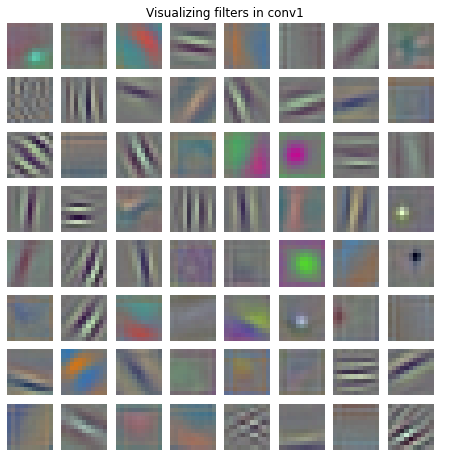

In [247]:
def vis_square(data, title=None):
    """Take a Tensor of shape (n, K, height, width) or (n, K, height, width)
       and visualize each (height, width) thing in a grid of size approx. sqrt(n) by sqrt(n)"""
    
    if data.size(1) > 3:
      data = data.view(-1, 1, data.size(2), data.size(3))
        
    data = to_numpy_image(data)
        
    # normalize data for display
    data = (data - data.min()) / (data.max() - data.min())
    
    # force the number of filters to be square
    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = (((0, n ** 2 - data.shape[0]),
               (0, 2), (0, 2))                 # add some space between filters
               + ((0, 0),) * (data.ndim - 3))  # don't pad the last dimension (if there is one)
    data = np.pad(data, padding, mode='constant', constant_values=1)  # pad with ones (white)
    
    # tile the filters into an image
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3) + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    
    data = data.squeeze()
    
    # plot it
    plt.figure(figsize=(8, 8))
    plt.imshow(data)
    plt.axis('off')
    if title: plt.title(title)
      

weights = model.features[0].weight.data
vis_square(weights, title="Visualizing filters in conv1")

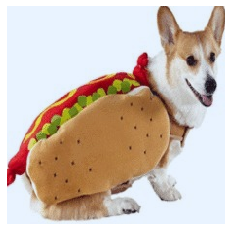

In [248]:
# Load the image of the dog
example_image, label = dog_dataset[10]
show_image(example_image)

Loading pre-trained weights from model zoo
Visualizing layer: conv1
Visualizing layer: relu1
Visualizing layer: conv2
Visualizing layer: relu2
Visualizing layer: conv3
Visualizing layer: relu3
Visualizing layer: conv4
Visualizing layer: relu4
Visualizing layer: conv5
Visualizing layer: relu5
Visualizing layer: fc6
Visualizing layer: fc7
Visualizing layer: fc8


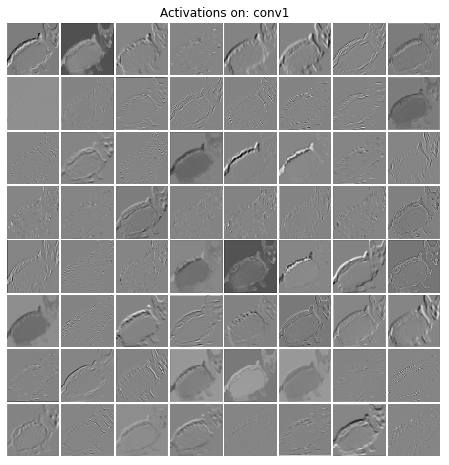

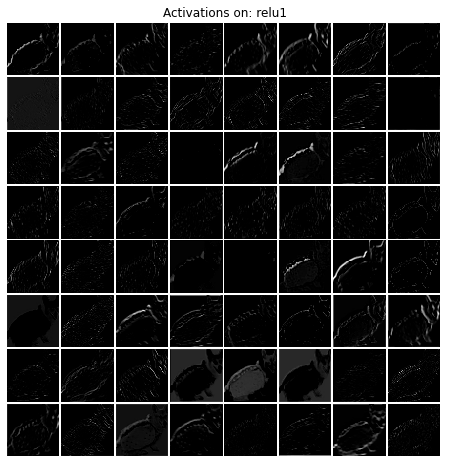

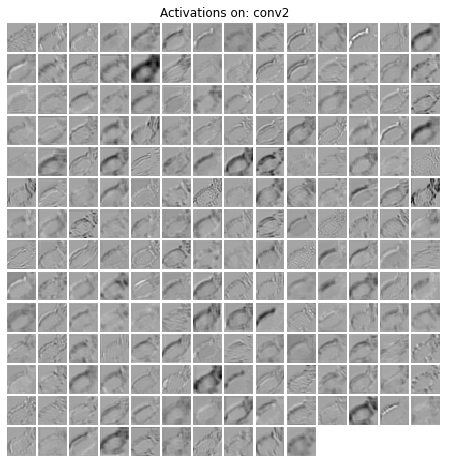

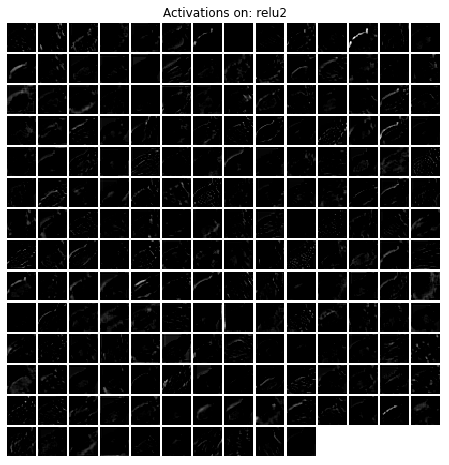

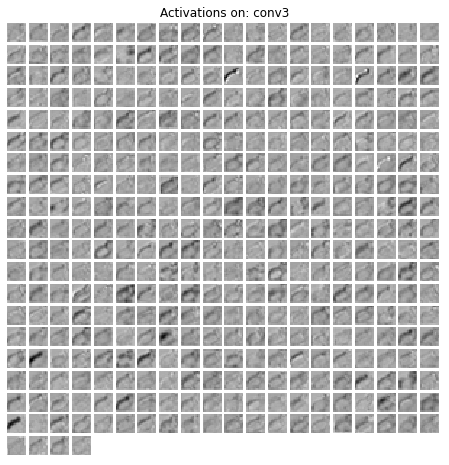

...

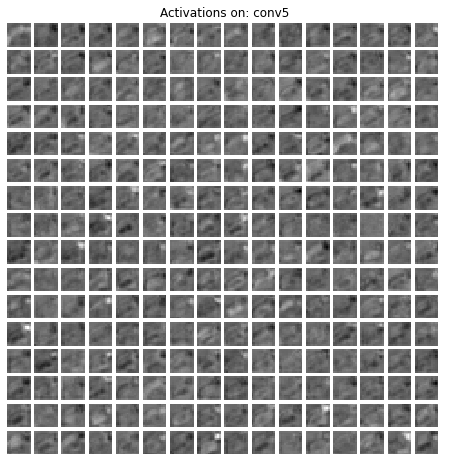

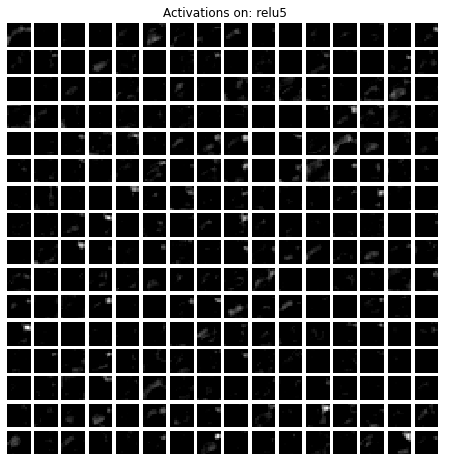

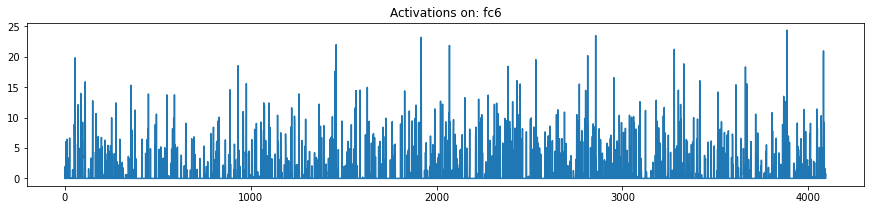

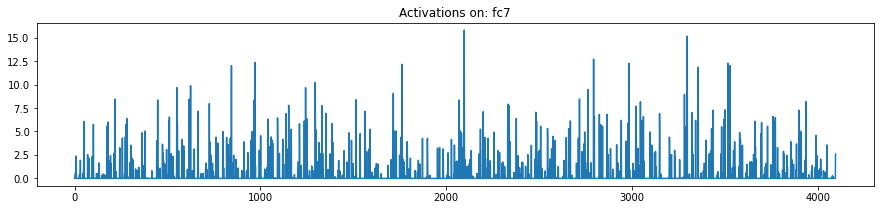

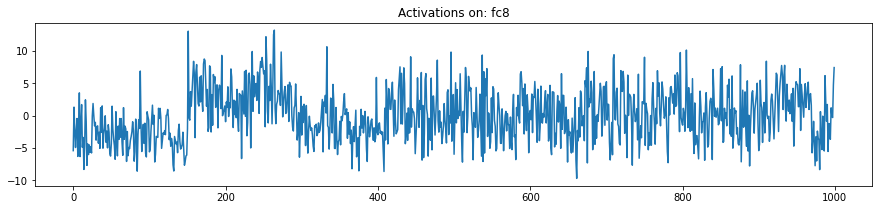

In [249]:
import functools

# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)

# Define a hook that visualizes a layer output
def show_activations_hook(name, module, input, output):
  
  print(f"Visualizing layer: {name}")
  # For conv/relu layer outputs (BxCxHxW) we plot an image as before
  if output.dim() == 4:
    vis_square(output, f"Activations on: {name}")
  
  # For linear layer outputs, we plot the activations as a line plot
  else:
    feat = output.data.view([-1]).cpu().numpy()
    plt.figure(figsize=(15, 3))
    plt.plot(feat)
    plt.title(f"Activations on: {name}")
  
# Register the hook on the select set of modules
for name, module in model.shortcut_modules():
  hook = functools.partial(show_activations_hook, name)
  module.register_forward_hook(hook)
  
# PyTorch modules work on minibatches and expect the first axis to be the batch axis
# If we run a model on a single image, we must turn this into a batch of size 1
model_input = Variable(example_image[np.newaxis, ...])

# Run the forward pass on the model
class_activations = model(model_input)[0]

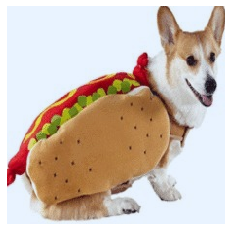

Loading pre-trained weights from model zoo
Predicted class: 264 - Cardigan, Cardigan Welsh corgi with probability 0.299546480178833


In [250]:
# Load the image of the hot dog
example_image, label = dog_dataset[10]
show_image(example_image)

# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)

# Set to eval mode to disable dropout
model.eval()

model_input = example_image[np.newaxis, ...]

model_input = model_input.clone()

# Run the forward pass on the model
class_activations = model(Variable(model_input))[0]

# Compute class probabilities
class_probs = F.softmax(class_activations, dim=0)

# Get the class index
prob, class_idx = torch.max(class_probs, 0)

# Take the integer index out of the variable and tensor
class_idx = class_idx.data.item()

predicted_class_name = labels_id2word[class_idx]
print(f"Predicted class: {class_idx} - {predicted_class_name} with probability {prob.data.item()}")

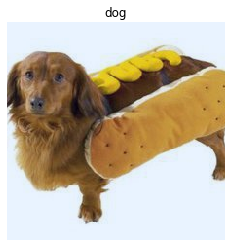

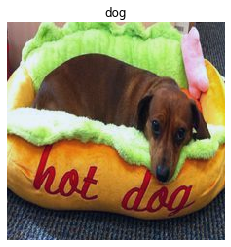

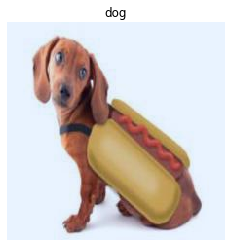

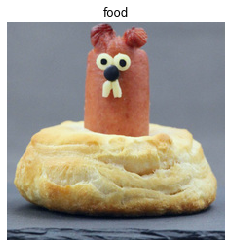

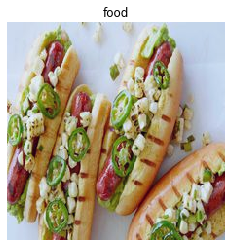

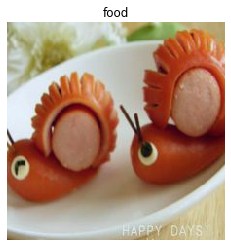

In [251]:
classes = ['dog', 'food']
class_datasets = [dog_dataset, food_dataset]

for cidx, cname in enumerate(classes):
  for i, (image, label) in enumerate(class_datasets[cidx]):
    if i >= 3:
      break
    show_image(image, classes[label])

In [252]:
# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)
N = len(full_dataset)
dataloader = DataLoader(
    full_dataset,
    batch_size=1024,
    shuffle=False,
    num_workers=0,
    pin_memory=False,
    drop_last=False)

assert len(dataloader) == 1, "Since batch_size is bigger than the number of examples, we should only have one batch"

for batch in dataloader:
  images = batch[0]
  labels = batch[1]
  labels_np = labels.numpy()
  
  class_activations = model(Variable(images))
  ilsvrc_class_probs = F.softmax(class_activations, dim=1)
  
  # Convert from Variable containing FloatTensor to numpy ndarray
  ilsvrc_class_probs_np = ilsvrc_class_probs.data.cpu().numpy()

  dogfood_class_probs_np = convert_ilsvrc2012_probs_to_dog_vs_food_probs(ilsvrc_class_probs_np)

  assert list(dogfood_class_probs_np.shape) == [N, 2]
  
  np.testing.assert_almost_equal(np.sum(dogfood_class_probs_np, axis=1), np.ones(N), decimal=5)
  
  print("Seems correct!")

Loading pre-trained weights from model zoo
Seems correct!


In [253]:
predicted_class = np.argmax(dogfood_class_probs_np, axis=1)
correct_mask = predicted_class == labels_np
num_correct = np.sum(correct_mask)
accuracy = 100.0 * float(num_correct) / N

print(f"Overall accuracy {accuracy} {num_correct} / {N}")

for cidx, cname in enumerate(classes):
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  num_correct = np.sum(predicted_cls == cidx)
  cls_acc = 100.0 * float(num_correct) / cls_mask.sum()

  print(f"{cname} class accuracy {cls_acc} {num_correct} / {cls_mask.sum()}")

Overall accuracy 93.10344827586206 54 / 58
dog class accuracy 90.9090909090909 30 / 33
food class accuracy 96.0 24 / 25


Predictions for class: dog
[21 31 11 30  0  9 16 15 20 24 19 18  4  8 29 27 14 10  6 28  7  3 26  5
 23 25 17 22 32  2  1 12 13]


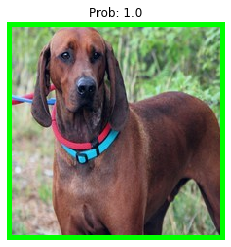

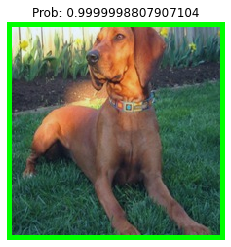

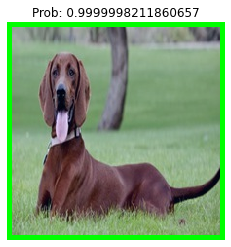

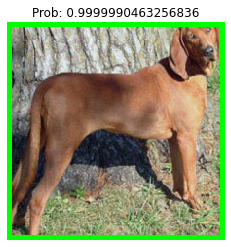

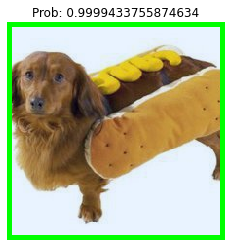

...

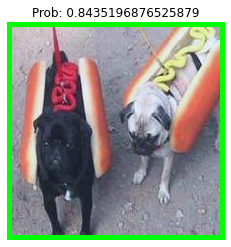

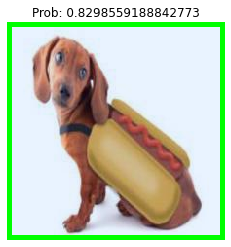

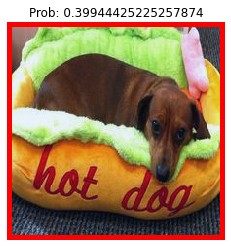

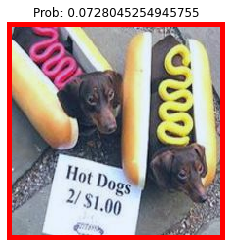

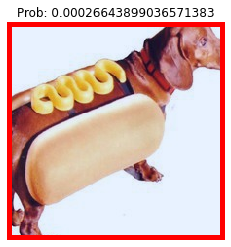

Predictions for class: food
[ 9 19 10 17 11 21 24 22 12 16  1 20  7  2 23  3 18  8  6 14  0 15  4 13
  5]


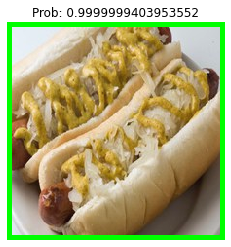

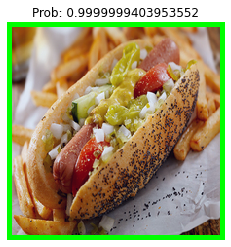

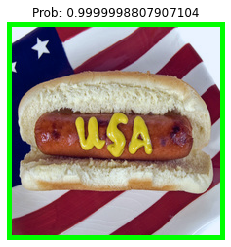

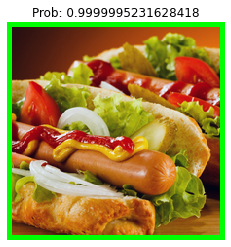

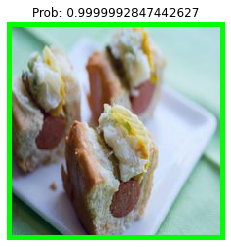

...

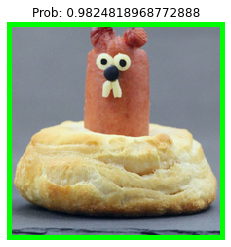

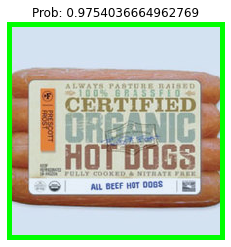

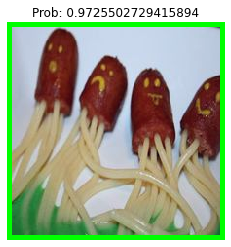

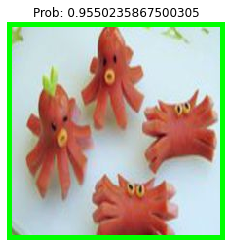

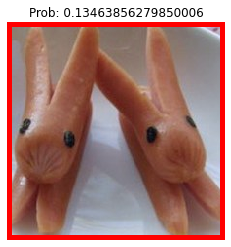

In [254]:
for cidx, cname in enumerate(classes):
  print(f"Predictions for class: {cname}")
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  cls_probs = dogfood_class_probs_np[cls_mask]
  correct = [p == cidx for p in predicted_cls]
  
  cls_images = [images[i] for i in range(len(images)) if cls_mask[i]]
  
  order = get_prediction_descending_order_indices(cls_probs, cidx)
  
  print(order)
  assert len(order) == cls_mask.sum()
  
  show_images(
    images = [cls_images[i] for i in order],
    correct_list = [correct[i] for i in order],
    titles = [f"Prob: {cls_probs[i, cidx]}" for i in order],
    size=128
  )

Loading pre-trained weights from model zoo
Saliency for class: dog
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.5354, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])


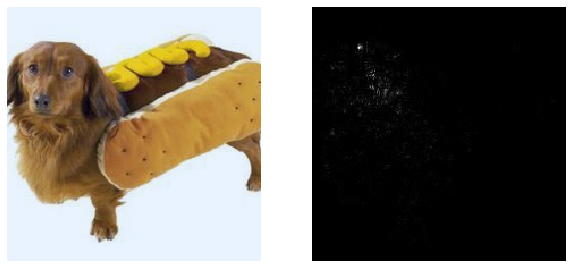

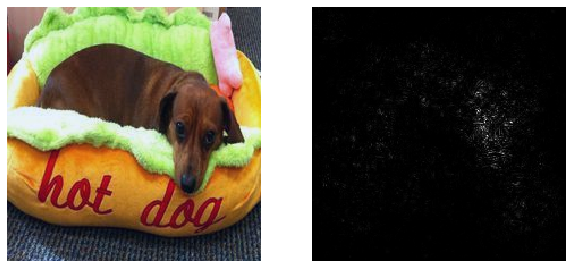

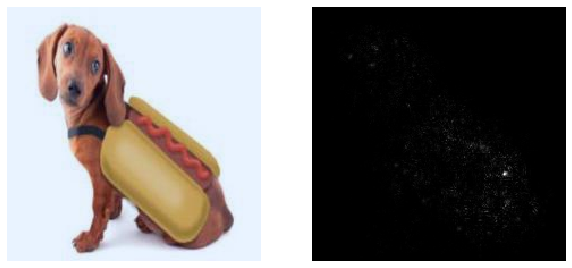

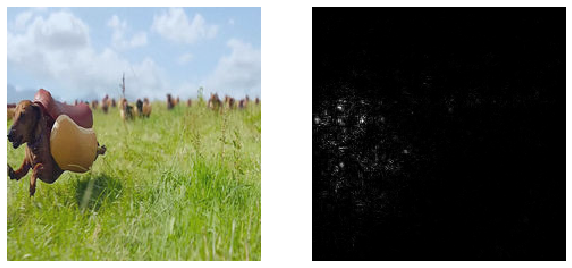

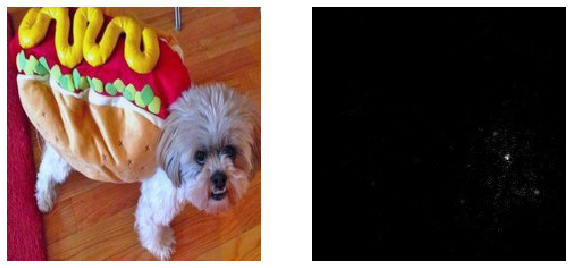

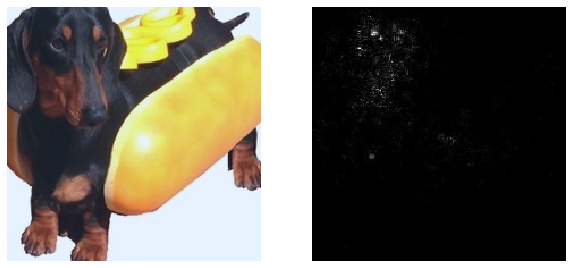

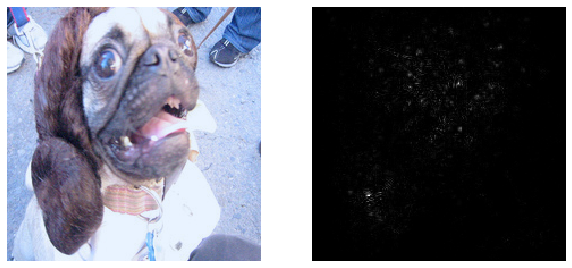

Saliency for class: food
tensor(2.4286, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.0823, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.5877, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])
tensor(2.6400, grad_fn=<MaxBackward1>)
torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])


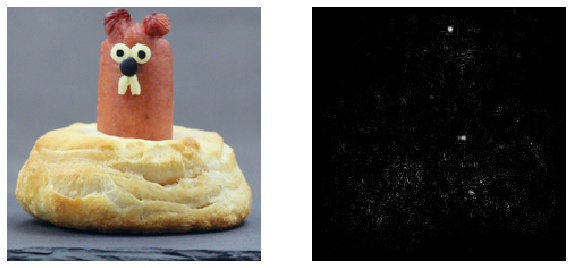

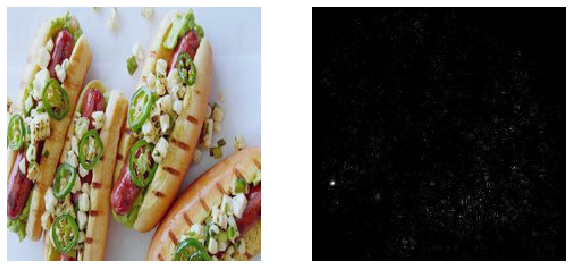

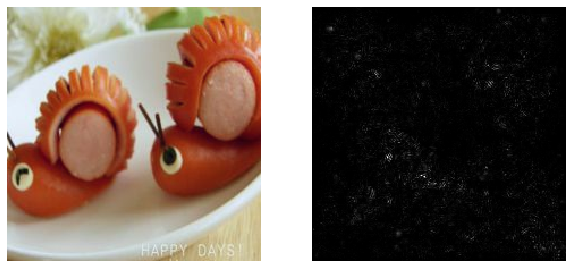

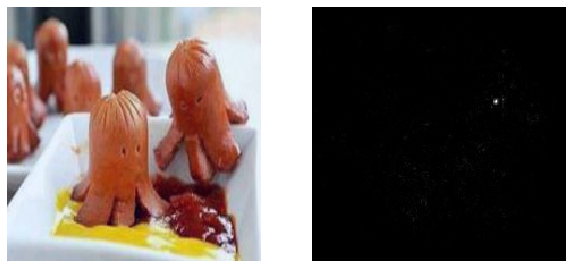

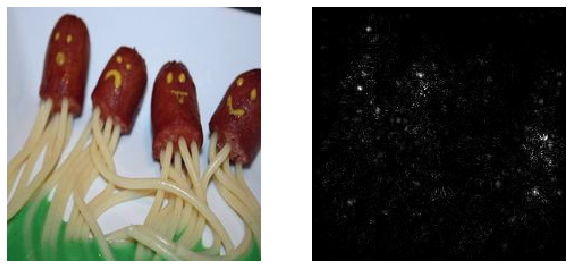

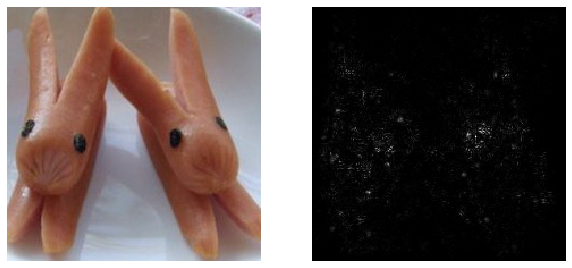

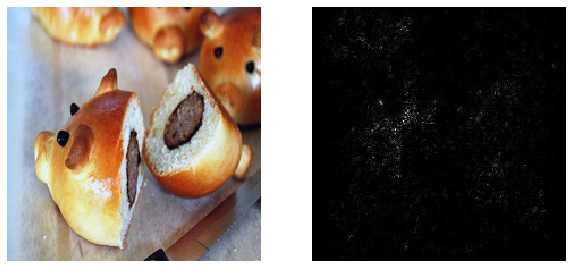

In [255]:
model = alexnet(pretrained=True)

def visualize_saliency(image):
    image_in = Variable(image.unsqueeze(0), requires_grad=True)
    print(torch.max(image_in))
    cls_scores = model(image_in)[0]
    max_score, max_idx = torch.max(cls_scores, 0)

    grad = compute_dscore_dimage(cls_scores, image_in, max_idx)
    print(grad.shape)
    vis = grad * grad
    vis, _ = torch.max(vis, 0)
    
    return vis

class_datasets = [dog_dataset, food_dataset]
  
num_images = 6
for cidx, cname in enumerate(classes):
  
  print(f"Saliency for class: {cname}")
  in_images = []
  vis_images = []
  
  for i, sample in enumerate(class_datasets[cidx]):
    image_i = sample[0]
    label_i = sample[1]
  
    vis_image = visualize_saliency(image_i)
    
    assert list(vis_image.shape) == [224, 224]
    
    vis_images.append(vis_image.unsqueeze(0))
    in_images.append(image_i)
    if i >= num_images:
      break
  
  row_list = list(zip(in_images, vis_images))
  
  show_image_rows(row_list)
  
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  cls_probs = dogfood_class_probs_np[cls_mask]

Loading pre-trained weights from model zoo
Fooling AlexNet into thinking this is a: snail
(1/100), 9.14998565804126e-05 confidence
(2/100), 0.00013498203088602168 confidence
(3/100), 0.0002656463493622141 confidence
(4/100), 0.0007067264050419908 confidence
(5/100), 0.0024297980417031795 confidence
(6/100), 0.010549369471846148 confidence
(7/100), 0.05716542946174741 confidence
(8/100), 0.379391317255795 confidence
(9/100), 2.166784554719925 confidence
(10/100), 9.427331387996674 confidence
(11/100), 29.513195157051086 confidence
(12/100), 59.6869170665741 confidence
(13/100), 83.49109888076782 confidence
(14/100), 94.63540315628052 confidence
Fooling AlexNet into thinking this is a: snail
(1/100), 0.0012756260730384383 confidence
(2/100), 0.001538774449727498 confidence
(3/100), 0.0021454581656144 confidence
(4/100), 0.003275974449934438 confidence
(5/100), 0.005460431566461921 confidence
(6/100), 0.009745246643433347 confidence
(7/100), 0.01827655651140958 confidence
(8/100), 0.03566

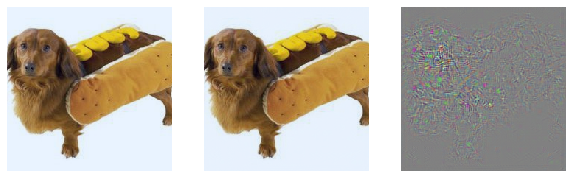

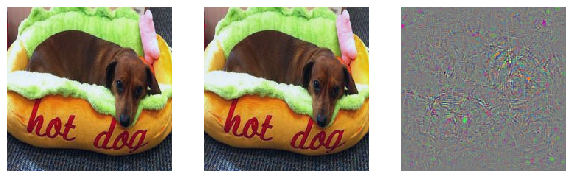

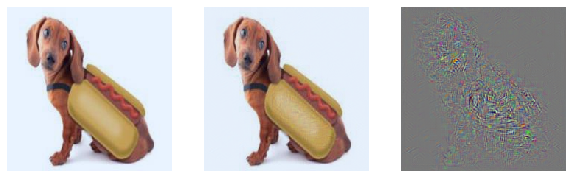

Fooling AlexNet into thinking this is a: snail
(1/100), 0.019558968779165298 confidence
(2/100), 0.023238877474796027 confidence
(3/100), 0.0320508552249521 confidence
(4/100), 0.04952866584062576 confidence
(5/100), 0.0835905666463077 confidence
(6/100), 0.15287076821550727 confidence
(7/100), 0.285142008215189 confidence
(8/100), 0.5019029602408409 confidence
(9/100), 0.8355671539902687 confidence
(10/100), 1.4796340838074684 confidence
(11/100), 2.4582695215940475 confidence
(12/100), 4.41703274846077 confidence
(13/100), 7.915663719177246 confidence
(14/100), 14.87966924905777 confidence
(15/100), 25.428608059883118 confidence
(16/100), 40.142273902893066 confidence
(17/100), 55.458998680114746 confidence
(18/100), 68.37173700332642 confidence
(19/100), 79.20365333557129 confidence
(20/100), 86.23591661453247 confidence
(21/100), 90.87875485420227 confidence
Fooling AlexNet into thinking this is a: snail
(1/100), 0.00010509820640436374 confidence
(2/100), 0.00011742787364710239 con

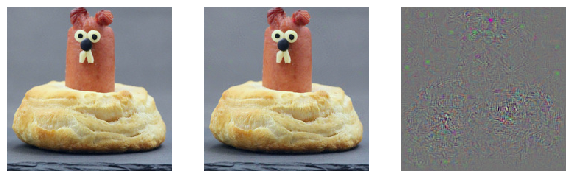

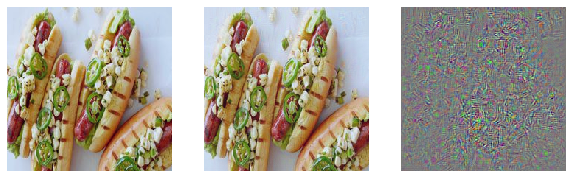

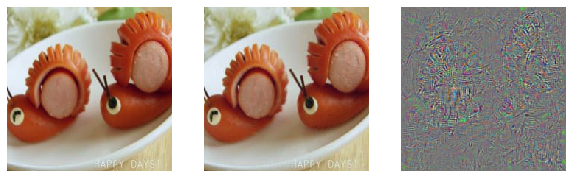

In [256]:
model = alexnet(pretrained=True)

# Set the model to eval mode
model.eval()

def make_fooling_image(image, target_class, learning_rate, regularization,
                       num_iter, momentum, threshold=0.9):
    """
    Fool AlexNet into thinking that any image has a particular class, by perturbing it just a little bit
    
    :param image: starting image CxHxW tensor
    :param target_class: the class that this will become after optimization
    :param learning_rate: either a constant, or a function that returns the learning rate at each iteration
    :param regularization: lambda parameter to multiply the regularizer
    :param num_iter: maximum number of iterations
    :param momentum: amount of momentum to use in the SGD 
    :param threshold: the target score for target_class
    """
    # Create batch dimension and turn into a variable
    image = image[np.newaxis, ...]
    
    print(f"Fooling AlexNet into thinking this is a: {labels_id2word[target_class]}")
    
    # This is the original image (used by the regularizer)
    orig_data = Variable(image.clone())
    
    image_in = Variable(image, requires_grad=True)
    velocity = torch.zeros_like(image_in)
        
    for i in range(num_iter):
        curr_scores = model(image_in)[0]
        curr_probs = F.softmax(curr_scores, 0)
        
        target_prob = curr_probs[target_class]
        target_score = curr_scores[target_class]
                
        # compute the gradient
        grad_wrt_image = fooling_image_gradient(
            target_score, orig_data, image_in, target_class, regularization)
        
        # update the image with the SGD rule
        image_in, velocity = normalized_sgd_with_momentum_update(
            image_in, grad_wrt_image, velocity, momentum, learning_rate)
        
        # Detach the image and velocity so that we don't backprop through
        # multiple iterations of the loop
        image_in = Variable(image_in.data, requires_grad = True)
        velocity = Variable(velocity.data, requires_grad = False)
        
        # Zero the gradients
        model.zero_grad()
        
        # Take the target probability out of the variable (turn it into float)
        target_prob = target_prob.data.item()
        
        # visualize the current state
        print(f"({i+1}/{num_iter}), {target_prob * 100} confidence")
        
        if target_prob > threshold:
            break
    
    delta = (image_in - orig_data).data
    return image_in, delta


num_images = 2
target_class=113
for cidx, cname in enumerate(classes):
    dataset = class_datasets[cidx]
    
    images_in = []
    fooling_images = []
    deltas = []
    
    for i, input in enumerate(dataset):
      image_in = input[0]
      label = input[1]
      
      fooling_image, delta = make_fooling_image(
          image_in,
          target_class=target_class,
          learning_rate=1e-1,
          regularization=5e-5,
          num_iter=100,
          momentum=0.9)
      
      delta = 0.5 + (5.0/255.0) * delta
    
      images_in.append(image_in)
      fooling_images.append(fooling_image)
      deltas.append(delta)
    
      if i >= num_images:
        break
        
    print ("\nLeft: original, middle: fooling image, right: difference magnified by 5x (gray is 0).\n"
        "AlexNet will classify the middle image in each row as %r with high confidence" % (
        labels_id2word[target_class]))
    show_image_rows(list(zip(images_in, fooling_images, deltas)))

In [257]:
# take input image and cam-mask and make gradCam image
def show_cam_on_image(img, mask):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)

    plt.imshow(cv2.cvtColor(np.uint8(255*cam), cv2.COLOR_BGR2RGB))
    plt.show()

# Preprocess image before entering a pretrained model
def preprocess_image(img):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]

    preprocessed_img = img.copy()[:, :, ::-1]
    for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input

# Take the gradient information flowing into the last convolutional layer of the CNN 
# and features map of last convolutional layer
# and then make masks for guided-gradCam 
def makemask(grads_val, features):
  
  grads_val, features = gradcam(model, input_path)

  target = features
  target = target.cpu().data.numpy()[0, :]

  weights = np.mean(grads_val, axis=(2, 3))[0, :]
  cam = np.zeros(target.shape[1:], dtype=np.float32)

  for i, w in enumerate(weights):
    cam += w * target[i, :, :]

  cam = np.maximum(cam, 0)
  cam = cv2.resize(cam, input_img.shape[2:])
  cam = cam - np.min(cam)
  cam = cam / np.max(cam)

  show_cam_on_image(img, cam)

  return cam

# preprocess guided Backprop and guided grad-Cam to imshow these images
def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img*255)

# take the model, mask, input image's path to make guided backprop, guided gradCam
def Guide_gradcam(model, mask, input_path):
    img = cv2.imread(input_path, 1)
    img = np.float32(cv2.resize(img, (224, 224))) / 255
    input_img = preprocess_image(img)

    model.eval()

    changerelu(model)

    #Get guided backprop, guided gradCam
    output = model(input_img)
    index = np.argmax(output.cpu().data.numpy())
    one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
    one_hot[0][index] = 1
    one_hot = torch.from_numpy(one_hot).requires_grad_(True)
    one_hot = torch.sum(one_hot * output)

    one_hot.backward(retain_graph=True)
    output = input_img.grad.cpu().data.numpy()
    output = output[0, :, :, :]

    gb = output
    gb = gb.transpose((1, 2, 0))
    cam_mask = cv2.merge([cam, cam, cam])
    cam_gb = deprocess_image(cam_mask*gb)
    gb = deprocess_image(gb)

    plt.imshow(cv2.cvtColor(cam_gb, cv2.COLOR_BGR2RGB))
    plt.show()
    plt.imshow(cv2.cvtColor(gb, cv2.COLOR_BGR2RGB))
    plt.show()

In [258]:
save_grad = []

# to get a gradient in intermediate gradient value, it is recommand to use .register-hook function
# the hook_func below is used with .register-hook function
def hook_func(grad):
  save_grad.append(grad)
  return grad

def gradcam(model, input_path):
  img = cv2.imread(input_path, 1)
  img = np.float32(cv2.resize(img, (224, 224))) / 255
  input_img = preprocess_image(img)
  x = input_img

  #### PA3 implementation start####
  ### You should take the gradient information flowing into the last convolutional layer of the CNN
  feature_module = model.layer4
  model.eval()
  target_activation = "2"

  for name, module in model._modules.items():
    if module == feature_module:
      for name2, module2 in feature_module._modules.items():
        x = module2(x)
        output = []
        if name2 in target_activation:
          x.register_hook(hook_func)
          features = x
    elif "avgpool" in name.lower():
      x = module(x)
      x = x.view(x.size(0),-1)
    else:
      x = module(x)

  output = x
  
  ### placeholder ###
  # features : intermediate feature map
  # output : model's output

  index = np.argmax(output.cpu().data.numpy())
  one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
  one_hot[0][index] = 1
  one_hot = torch.from_numpy(one_hot).requires_grad_(True)
  one_hot = torch.sum(one_hot * output)

  feature_module.zero_grad()
  model.zero_grad()
  one_hot.backward(retain_graph=True)

  ## grads_val : intermediate feature map's gradient

  grads_val = save_grad[0].cpu().data.numpy()

  #### PA3 implementation end ####

  return grads_val, features


# To get a guided Backprop and Guided Grad-CAM, you shuld change the relu function in a pretrained model 
# with the built-in function according to the GradCam Paper

# the code below is to assign built-in function
# Source : https://pytorch.org/tutorials/beginner/examples_autograd/two_layer_net_custom_function.html
class MyReLu(Function):
    @staticmethod
    def forward(self, input):
        positive_mask = (input > 0).type_as(input)
        output = torch.addcmul(torch.zeros(input.size()).type_as(input), input, positive_mask)
        self.save_for_backward(input, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        input, output = self.saved_tensors
        grad_input = None

        positive_mask_1 = (input > 0).type_as(grad_output)
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        grad_input = torch.addcmul(torch.zeros(input.size()).type_as(input),
                                   torch.addcmul(torch.zeros(input.size()).type_as(input), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

# the code below is to change relu function with manual built in function
def changerelu(model):
  for name, module in model._modules.items():
    changerelu(module)
    if name == 'relu':
      model._modules[name] = MyReLu.apply  


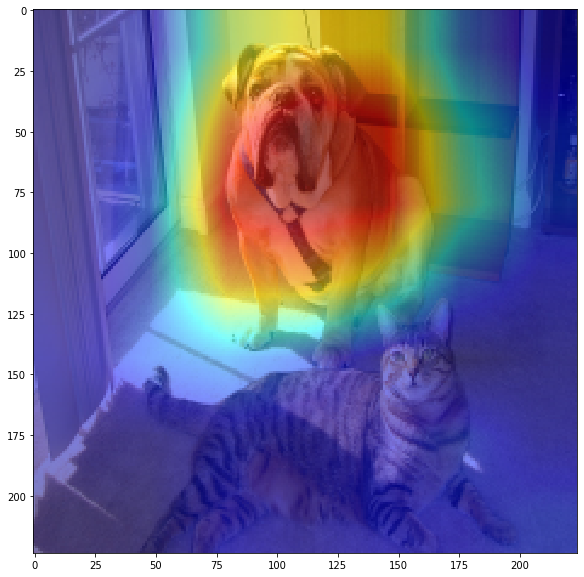

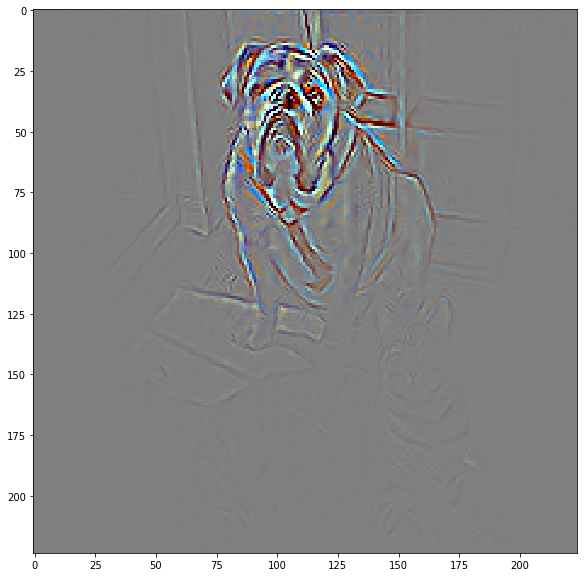

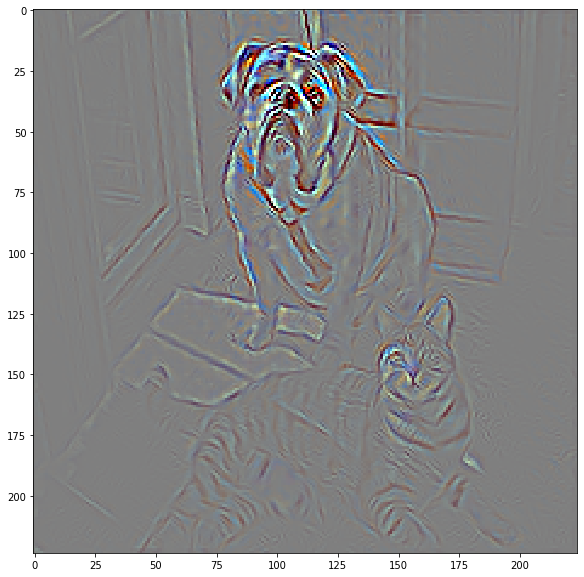

In [259]:
model = torchvision.models.resnet50(pretrained=True)
input_path = '/gdrive/My Drive/datas/both.png'

grads_val, features = gradcam(model, input_path)

mask = makemask(grads_val, features)

Guide_gradcam(model, mask, input_path)